In [2]:
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import albumentations as A
import time
from tqdm import tqdm

In [10]:
obj_dict = {
    1: {'folder': "trash", 'longest_min': 250, 'longest_max': 700},
    2: {'folder': "paper", 'longest_min': 250, 'longest_max': 700},
    3: {'folder': "glass", 'longest_min': 250, 'longest_max': 700},
    4: {'folder': "plastic", 'longest_min': 250, 'longest_max': 700},
    5: {'folder': "cardboard", 'longest_min': 250, 'longest_max': 700},
    6: {'folder': "metal", 'longest_min': 250, 'longest_max': 700},
}

PATH_MAIN = "data"

for k, _ in obj_dict.items():
    folder_name = obj_dict[k]['folder']
    
    files_imgs = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'images')))
    files_imgs = [os.path.join(PATH_MAIN, folder_name, 'images', f) for f in files_imgs]
    
    files_masks = sorted(os.listdir(os.path.join(PATH_MAIN, folder_name, 'masks')))
    files_masks = [os.path.join(PATH_MAIN, folder_name, 'masks', f) for f in files_masks]
    
    obj_dict[k]['images'] = files_imgs
    obj_dict[k]['masks'] = files_masks
    
print("The first five files from the sorted list of paper images:", obj_dict[2]['images'][:5])
print("\nThe first five files from the sorted list of battery masks:", obj_dict[2]['masks'][:5])

files_bg_imgs = os.listdir(os.path.join(PATH_MAIN, 'bg'))
files_bg_imgs = [os.path.join(PATH_MAIN, 'bg', f) for f in files_bg_imgs]

bg_bbox = {}

files_bg_noise_imgs = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "images"))
files_bg_noise_imgs = [os.path.join(PATH_MAIN, "bg_noise", "images", f) for f in files_bg_noise_imgs]
files_bg_noise_masks = os.listdir(os.path.join(PATH_MAIN, "bg_noise", "masks"))
files_bg_noise_masks = [os.path.join(PATH_MAIN, "bg_noise", "masks", f) for f in files_bg_noise_masks]

print("\nThe first five files from the sorted list of background images:", files_bg_imgs[:5])
print("\nThe first five files from the sorted list of background noise images:", files_bg_noise_imgs[:5])
print("\nThe first five files from the sorted list of background noise masks:", files_bg_noise_masks[:5])

The first five files from the sorted list of paper images: ['data/paper/images/paper143-removebg-preview_png.rf.878b8d5fda381c124746c719c790e84b.jpg', 'data/paper/images/paper79-removebg-preview_png.rf.db9faa2271cef633b36d0e0983e7c666.jpg']

The first five files from the sorted list of battery masks: ['data/paper/masks/paper143-removebg-preview.png', 'data/paper/masks/paper79-removebg-preview.png']

The first five files from the sorted list of background images: ['data/bg/.DS_Store', 'data/bg/bg_6.jpg', 'data/bg/bg_7.jpg', 'data/bg/bg_5.jpg', 'data/bg/bg_4.jpg']

The first five files from the sorted list of background noise images: ['data/bg_noise/images/19.jpg']

The first five files from the sorted list of background noise masks: ['data/bg_noise/masks/19.png']


3. Images and masks

In [5]:
def get_img_and_mask(img_path, mask_path):

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    
    mask_b = mask[:,:,0] != 0 # This is boolean mask
    mask = mask_b.astype(np.uint8) # This is binary mask
    
    return img, mask

def get_img_and_mask_inverted(img_path, mask_path):

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    mask = cv2.imread(mask_path)
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
    
    mask_b = mask[:,:,0] == 0 # This is boolean mask
    mask = mask_b.astype(np.uint8) # This is binary mask
    
    return img, mask

In [12]:
annotation_path = '/Users/macbook/Desktop/Algo Wastetide/Waste detector v5.v1i.coco/train/_annotations.coco.json'

def get_bbox():
    bbox = [[0, 0, 0, 0] for i in range(8)]
    files = ['' for i in range(8)]
    import json
    with open(annotation_path) as f:
        data = json.load(f)
    for i in range(len(data['annotations'])):
        if data['images'][data['annotations'][i]['image_id']]['file_name'][:2]=='bg':
            bbox[int(data['images'][data['annotations'][i]['image_id']]['file_name'][3])] = data['annotations'][i]['bbox']
            files[int(data['images'][data['annotations'][i]['image_id']]['file_name'][3])] = data['images'][data['annotations'][i]['image_id']]['file_name'][:4]
    return bbox, files
    
print(get_bbox()[0])
print(get_bbox()[1])

for i in range(1,7):
    bg_bbox[get_bbox()[1][i] + '.jpg'] = get_bbox()[0][i]

print(bg_bbox)

[[0, 0, 0, 0], [184, 117, 437.5, 430], [89, 232, 431.373, 302.222], [146, 143, 371.25, 373.125], [0, 0, 0, 0], [142, 166, 365, 351.875], [23, 64, 531.25, 508.75], [0, 0, 0, 0]]
['', 'bg_1', 'bg_2', 'bg_3', '', 'bg_5', 'bg_6', '']
{'bg_1': [184, 117, 437.5, 430], 'bg_2': [89, 232, 431.373, 302.222], 'bg_3': [146, 143, 371.25, 373.125], '': [0, 0, 0, 0], 'bg_5': [142, 166, 365, 351.875], 'bg_6': [23, 64, 531.25, 508.75], 'bg_1.jpg': [184, 117, 437.5, 430], 'bg_2.jpg': [89, 232, 431.373, 302.222], 'bg_3.jpg': [146, 143, 371.25, 373.125], '.jpg': [0, 0, 0, 0], 'bg_5.jpg': [142, 166, 365, 351.875], 'bg_6.jpg': [23, 64, 531.25, 508.75]}


Image file: data/glass/images/glass34-removebg-preview_png.rf.04d7d72b121403a02affb66105e4106e.jpg
Mask file: data/glass/masks/glass34-removebg-preview.png

Shape of the image of the object: (384, 512, 3)
Shape of the binary mask: (384, 512)


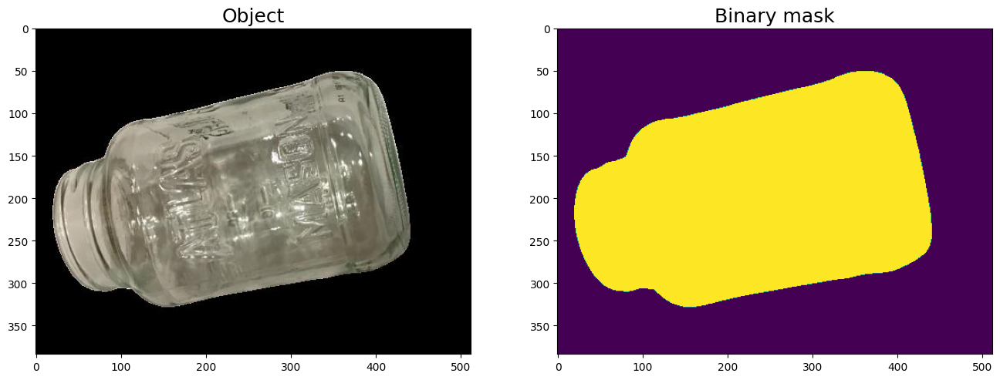

In [6]:
img_path = obj_dict[3]['images'][1]
mask_path = obj_dict[3]['masks'][1]

img, mask = get_img_and_mask(img_path, mask_path)

print("Image file:", img_path)
print("Mask file:", mask_path)
print("\nShape of the image of the object:", img.shape)
print("Shape of the binary mask:", mask.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img)
ax[0].set_title('Object', fontsize=18)
ax[1].imshow(mask)
ax[1].set_title('Binary mask', fontsize=18);

4. Resizing background images

In [7]:
def resize_img(img, desired_max, desired_min=None):
   
    h, w = img.shape[0], img.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_min:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Compose([
        A.Sequential([
        A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
        ], p=1)
    ])

    transformed = transform_resize(image=img)
    img_r = transformed["image"]
        
    return img_r

def resize_bbox(bbox, img, desired_min, desired_max=None):

    h, w = img.shape[0], img.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_max:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Compose([
    A.Sequential([
        A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
    ], p=1),],
    bbox_params=A.BboxParams(format='coco', label_fields=['category_ids'])
    )

    transformed = transform_resize(image=img, bboxes=[bbox], category_ids=[0])
    bbox_r = transformed["bboxes"][0]
        
    return bbox_r

Shape of the original background image: (1024, 1024, 3)
Shape of the resized background image (desired_max=1920, desired_min=None): (1920, 1920, 3)
Shape of the resized background image (desired_max=1920, desired_min=1080): (1080, 1920, 3)


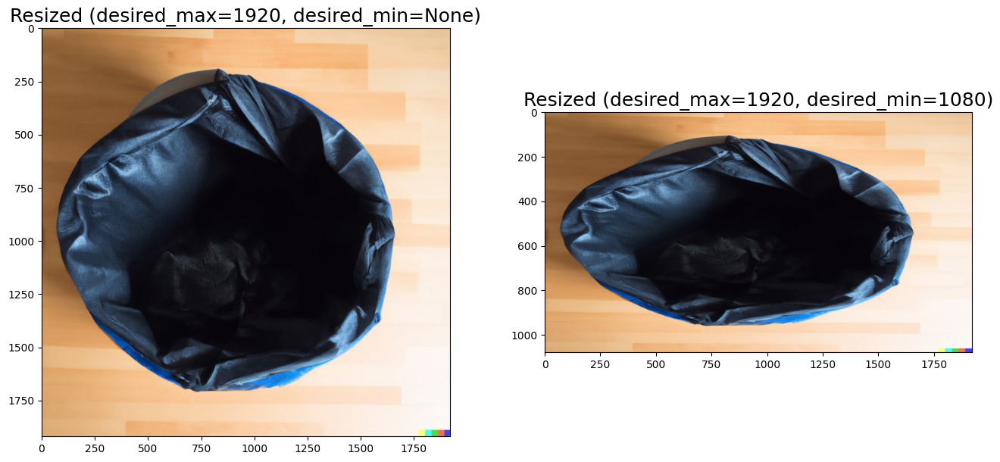

In [8]:
# Let's look how a random background image can be resized with resize_img() function

img_bg_path = files_bg_imgs[1]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

img_bg_resized_1 = resize_img(img_bg, desired_max=1920, desired_min=None)
img_bg_resized_2 = resize_img(img_bg, desired_max=1920, desired_min=1080)

print("Shape of the original background image:", img_bg.shape)

print("Shape of the resized background image (desired_max=1920, desired_min=None):", img_bg_resized_1.shape)
print("Shape of the resized background image (desired_max=1920, desired_min=1080):", img_bg_resized_2.shape)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_bg_resized_1)
ax[0].set_title('Resized (desired_max=1920, desired_min=None)', fontsize=18)
ax[1].imshow(img_bg_resized_2)
ax[1].set_title('Resized (desired_max=1920, desired_min=1080)', fontsize=18);

5. Resizing and transforming objects

In [3]:
def resize_transform_obj(img, mask, longest_min, longest_max, transforms=False):
   
    h, w = mask.shape[0], mask.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = np.random.randint(longest_min, longest_max)
    shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    transform_resize = A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)

    transformed_resized = transform_resize(image=img, mask=mask)
    img_t = transformed_resized["image"]
    mask_t = transformed_resized["mask"]
        
    if transforms:
        transformed = transforms(image=img_t, mask=mask_t)
        img_t = transformed["image"]
        mask_t = transformed["mask"]
        
    return img_t, mask_t

transforms_bg_obj = A.Compose([
    A.Rotate(limit=90,border_mode=cv2.BORDER_CONSTANT,p=1),
    A.ColorJitter(brightness=0.3,
                  contrast=0.3,
                  saturation=0.3,
                  hue=0.07,
                  always_apply=False,
                  p=1),
    A.Blur(blur_limit=(3,15),
           always_apply=False,
           p=0.5)
])

transforms_obj = A.Compose([
    A.Rotate(limit=90,border_mode=cv2.BORDER_CONSTANT,p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.2, 0.1),
                               contrast_limit=0.1,
                               brightness_by_max=True,
                               always_apply=False,
                               p=1)
])

In [10]:
transforms_brightness_list = [A.Compose([
    A.Rotate(limit=90,border_mode=cv2.BORDER_CONSTANT,p=1),
    A.RandomBrightnessContrast(brightness_limit=(-0.3+i*0.05, 0.05),
                               contrast_limit=0.1,
                               brightness_by_max=True,
                               always_apply=False,
                               p=1)
]) for i in range(6)]


Shape of the image of the transformed object: (253, 338, 3)
Shape of the transformed binary mask: (253, 338)




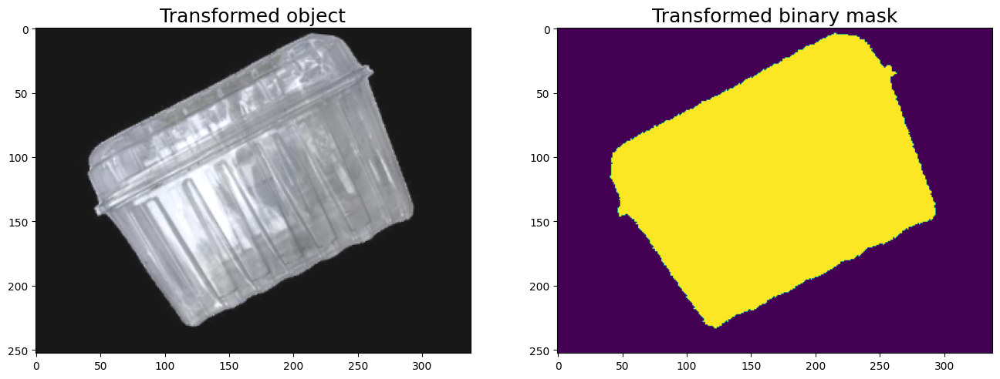

In [11]:
# Let's look how image and binary mask of a random object can be transformed
# with help of resize_transform_obj() function

img_path = obj_dict[4]['images'][2]
mask_path = obj_dict[4]['masks'][2]

img, mask = get_img_and_mask(img_path, mask_path)

img_t, mask_t = resize_transform_obj(img,
                                     mask,
                                     longest_min=300,
                                     longest_max=400,
                                     transforms=transforms_obj)

print("Shape of the image of the transformed object:", img_t.shape)
print("Shape of the transformed binary mask:", mask_t.shape)
print("\n")

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_t)
ax[0].set_title('Transformed object', fontsize=18)
ax[1].imshow(mask_t)
ax[1].set_title('Transformed binary mask', fontsize=18);

In [92]:
def add_obj(img_comp, mask_comp, img, mask, x, y, idx):
    '''
    img_comp - composition of objects
    mask_comp - composition of objects` masks
    img - image of object
    mask - binary mask of object
    x, y - coordinates where center of img is placed
    Function returns img_comp in CV2 RGB format + mask_comp
    '''
    h_comp, w_comp = img_comp.shape[0], img_comp.shape[1]
    
    h, w = img.shape[0], img.shape[1]
    

    x = x - int(w/2)
    y = y - int(h/2)
    
    mask_b = mask == 1
    mask_rgb_b = np.stack([mask_b, mask_b, mask_b], axis=2)
    
    if x >= 0 and y >= 0:
    
        h_part = h - max(0, y+h-h_comp) # h_part - part of the image which gets into the frame of img_comp along y-axis
        w_part = w - max(0, x+w-w_comp) # w_part - part of the image which gets into the frame of img_comp along x-axis

        img_comp[y:y+h_part, x:x+w_part, :] = img_comp[y:y+h_part, x:x+w_part, :] * ~mask_rgb_b[0:h_part, 0:w_part, :] + (img * mask_rgb_b)[0:h_part, 0:w_part, :]
        mask_comp[y:y+h_part, x:x+w_part] = mask_comp[y:y+h_part, x:x+w_part] * ~mask_b[0:h_part, 0:w_part] + (idx * mask_b)[0:h_part, 0:w_part]
        mask_added = mask[0:h_part, 0:w_part]
        
    elif x < 0 and y < 0:
        
        h_part = h + y
        w_part = w + x
        
        img_comp[0:0+h_part, 0:0+w_part, :] = img_comp[0:0+h_part, 0:0+w_part, :] * ~mask_rgb_b[h-h_part:h, w-w_part:w, :] + (img * mask_rgb_b)[h-h_part:h, w-w_part:w, :]
        mask_comp[0:0+h_part, 0:0+w_part] = mask_comp[0:0+h_part, 0:0+w_part] * ~mask_b[h-h_part:h, w-w_part:w] + (idx * mask_b)[h-h_part:h, w-w_part:w]
        mask_added = mask[h-h_part:h, w-w_part:w]
        
    elif x < 0 and y >= 0:
        
        h_part = h - max(0, y+h-h_comp)
        w_part = w + x
        img_comp[y:y+h_part, 0:0+w_part, :] = img_comp[y:y+h_part, 0:0+w_part, :] * ~mask_rgb_b[0:h_part, w-w_part:w, :] + (img * mask_rgb_b)[0:h_part, w-w_part:w, :]
        mask_comp[y:y+h_part, 0:0+w_part] = mask_comp[y:y+h_part, 0:0+w_part] * ~mask_b[0:h_part, w-w_part:w] + (idx * mask_b)[0:h_part, w-w_part:w]
        mask_added = mask[0:h_part, w-w_part:w]
        
    elif x >= 0 and y < 0:
        
        h_part = h + y
        w_part = w - max(0, x+w-w_comp)
                
        img_comp[0:0+h_part, x:x+w_part, :] = img_comp[0:0+h_part, x:x+w_part, :] * ~mask_rgb_b[h-h_part:h, 0:w_part, :] + (img * mask_rgb_b)[h-h_part:h, 0:w_part, :]
        mask_comp[0:0+h_part, x:x+w_part] = mask_comp[0:0+h_part, x:x+w_part] * ~mask_b[h-h_part:h, 0:w_part] + (idx * mask_b)[h-h_part:h, 0:w_part]
        mask_added = mask[h-h_part:h, 0:w_part]
    
    return img_comp, mask_comp, mask_added

h_comp, w_comp: 640 640
h, w: 384 512
h_part, w_part: 384 512


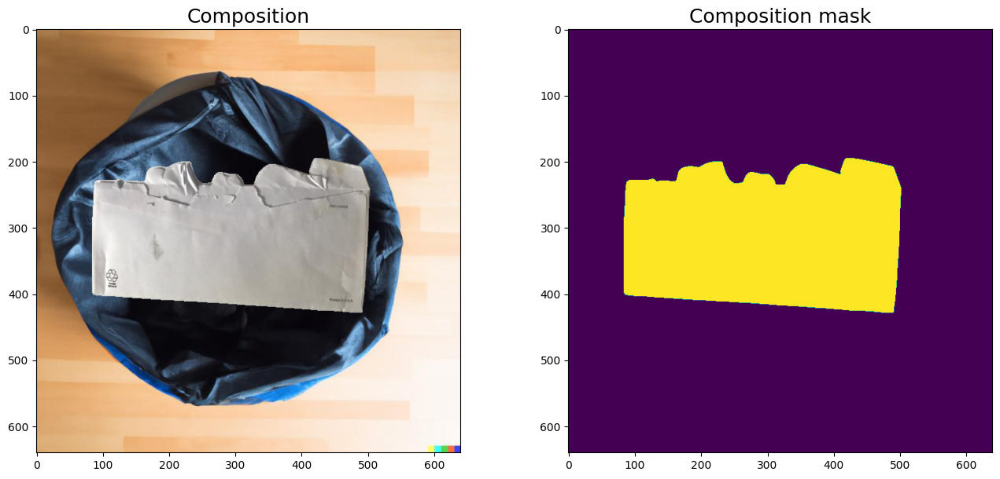

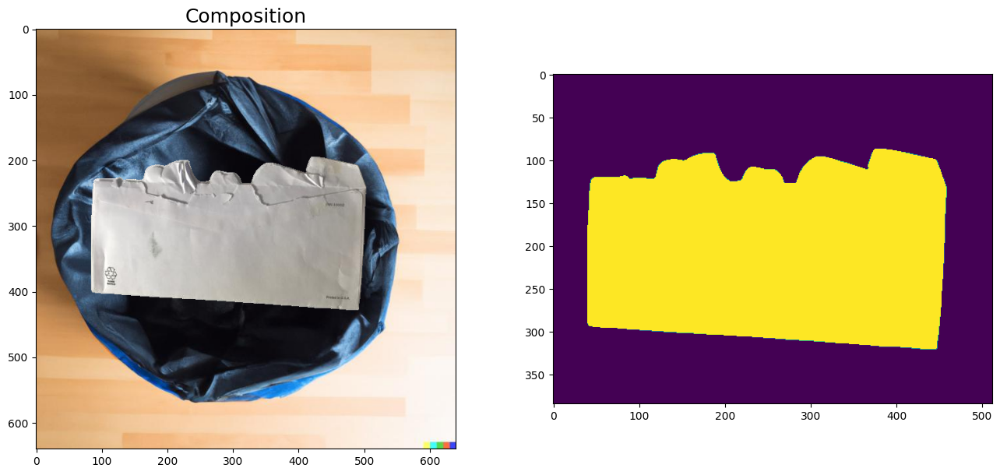

In [82]:
img_bg_path = files_bg_imgs[1]
img_bg = cv2.imread(img_bg_path)
img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)

h, w = img_bg.shape[0], img_bg.shape[1]
mask_comp = np.zeros((h,w), dtype=np.uint8)

img_path = obj_dict[2]['images'][0]
mask_path = obj_dict[2]['masks'][0]
img, mask = get_img_and_mask(img_path, mask_path)

img_comp, mask_comp, _ = add_obj(img_bg, mask_comp, img, mask, x=350, y=400, idx=1)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);



h_comp, w_comp: 640 640
h, w: 384 512
h_part, w_part: 382 446


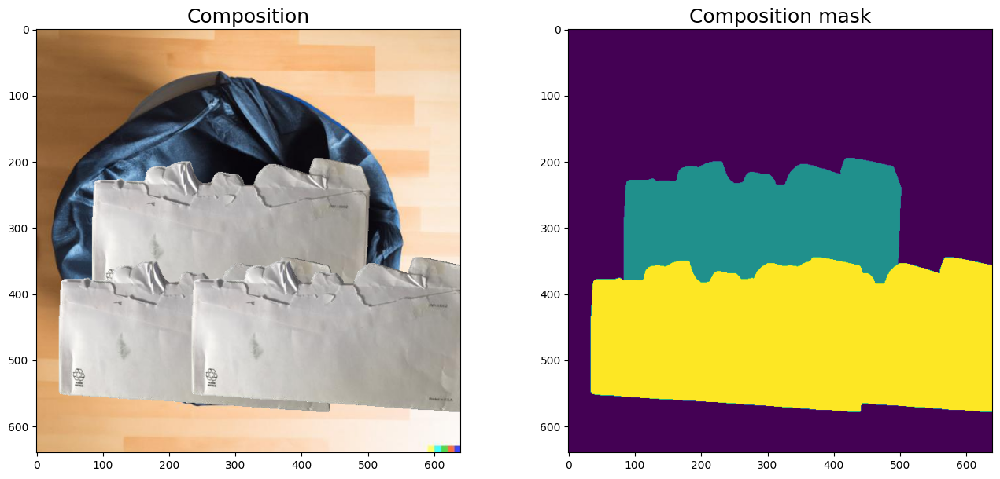

In [86]:
img_comp, mask_comp, _ = add_obj(img_comp, mask_comp, img, mask, x=450, y=450, idx=2)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(mask_comp)
ax[1].set_title('Composition mask', fontsize=18);


Controlling degree of overlapping

In [45]:
def check_areas(mask_comp, obj_areas, overlap_degree=0.3):
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:-1]
    masks = mask_comp == obj_ids[:, None, None]
    
    ok = True
    
    if len(np.unique(mask_comp)) != np.max(mask_comp) + 1:
        ok = False
        return ok
    
    for idx, mask in enumerate(masks):
        if np.count_nonzero(mask) / obj_areas[idx] < 1 - overlap_degree:
            ok = False
            break
            
    return ok

In [46]:
def create_bg_with_noise(files_bg_imgs,
                         files_bg_noise_imgs,
                         files_bg_noise_masks,
                         bg_max=1920,
                         bg_min=1080,
                         max_objs_to_add=60,
                         longest_bg_noise_max=1000,
                         longest_bg_noise_min=200,
                         blank_bg=False):
    
    if blank_bg:
        img_comp_bg = np.ones((bg_min, bg_max,3), dtype=np.uint8) * 255
        mask_comp_bg = np.zeros((bg_min, bg_max), dtype=np.uint8)
    else:    
        idx = np.random.randint(len(files_bg_imgs))
        img_bg = cv2.imread(files_bg_imgs[idx])
        img_bg = cv2.cvtColor(img_bg, cv2.COLOR_BGR2RGB)
        img_comp_bg = resize_img(img_bg, bg_max, bg_min)

        mask_comp_bg = np.zeros((img_comp_bg.shape[0], img_comp_bg.shape[1]), dtype=np.uint8)

    for i in range(1, np.random.randint(max_objs_to_add) + 2):
        idx = np.random.randint(len(files_bg_noise_imgs))
        img, mask = get_img_and_mask_inverted(files_bg_noise_imgs[idx], files_bg_noise_masks[idx])
        x, y = np.random.randint(img_comp_bg.shape[1]), np.random.randint(img_comp_bg.shape[0])
        img_t, mask_t = resize_transform_obj(img, mask, longest_bg_noise_min, longest_bg_noise_max, transforms=transforms_bg_obj)
        img_comp_bg, _, _ = add_obj(img_comp_bg, mask_comp_bg, img_t, mask_t, x, y, i)
        
    return img_comp_bg

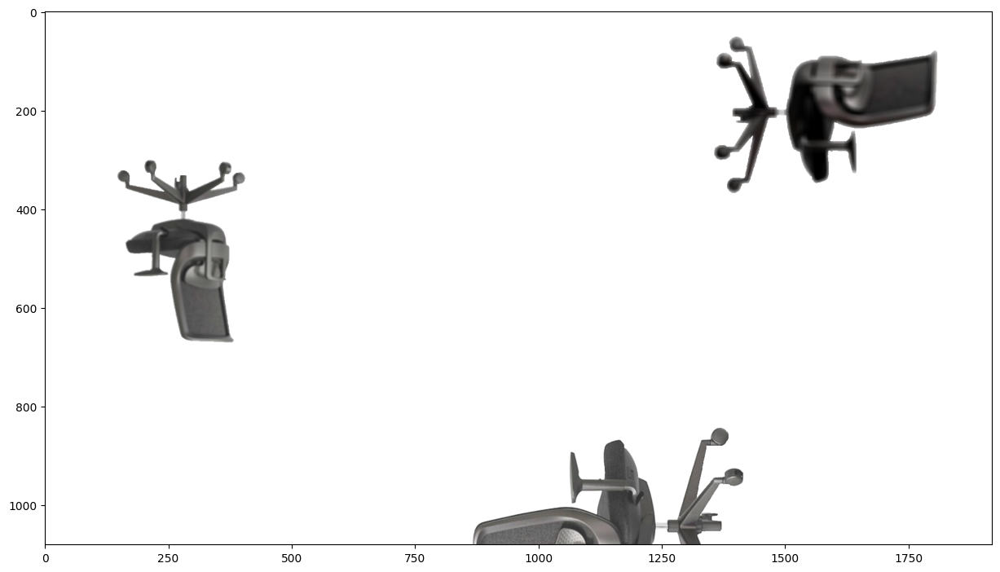

In [47]:
img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                   files_bg_noise_imgs,
                                   files_bg_noise_masks,
                                   max_objs_to_add=20,
                                   blank_bg=True)
plt.figure(figsize=(15,15))
plt.imshow(img_comp_bg)

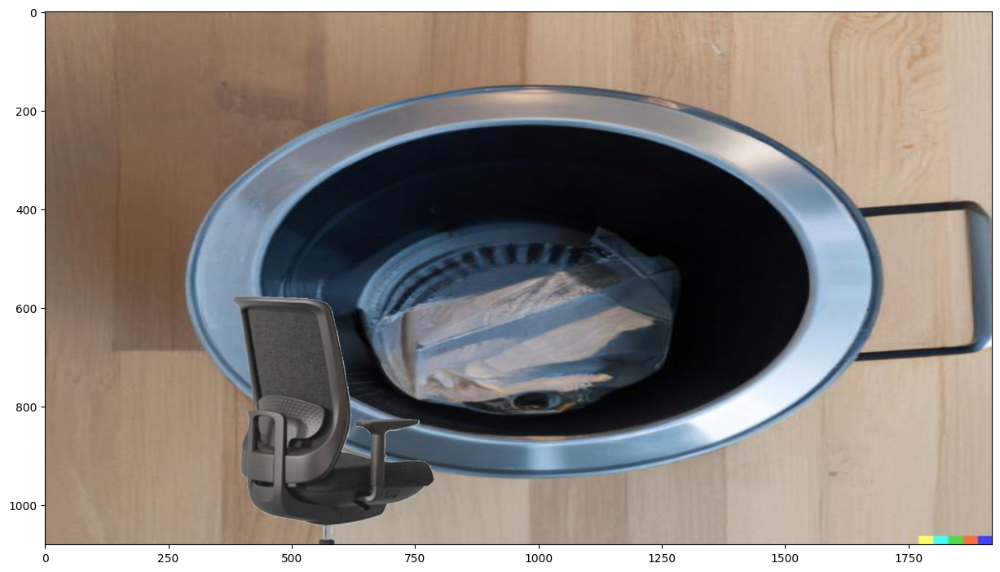

In [60]:
img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                   files_bg_noise_imgs,
                                   files_bg_noise_masks,
                                   max_objs_to_add=1)

plt.figure(figsize=(15,15))
plt.imshow(img_comp_bg)

In [49]:
def create_composition(img_comp_bg,
                       max_objs=15,
                       overlap_degree=0.2,
                       max_attempts_per_obj=10,xmin=0,ymin=0,xmax=0,ymax=0):

    img_comp = img_comp_bg.copy()
    h, w = img_comp.shape[0], img_comp.shape[1]
    mask_comp = np.zeros((h,w), dtype=np.uint8)

    if xmax == 0:
        xmax = w
    if ymax == 0:
        ymax = h
    
    obj_areas = []
    labels_comp = []
    num_objs = np.random.randint(max_objs) + 2
    
    i = 1
    
    for _ in range(1, num_objs):

        obj_idx = np.random.randint(len(obj_dict)) + 1
        
        for _ in range(max_attempts_per_obj):

            imgs_number = len(obj_dict[obj_idx]['images'])
            idx = np.random.randint(imgs_number)
            img_path = obj_dict[obj_idx]['images'][idx]
            mask_path = obj_dict[obj_idx]['masks'][idx]
            img, mask = get_img_and_mask(img_path, mask_path)

            # we select x and y randomly in the center of the image, between xmin and xmax, ymin and ymax

            x,y = np.random.randint(xmin, xmax), np.random.randint(ymin, ymax)
            longest_min = obj_dict[obj_idx]['longest_min']
            longest_max = obj_dict[obj_idx]['longest_max']
            img, mask = resize_transform_obj(img,
                                             mask,
                                             longest_min,
                                             longest_max,
                                             transforms=transforms_obj)

            if i == 1:
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                obj_areas.append(np.count_nonzero(mask_added))
                labels_comp.append(obj_idx)
                i += 1
                break
            else:        
                img_comp_prev, mask_comp_prev = img_comp.copy(), mask_comp.copy()
                img_comp, mask_comp, mask_added = add_obj(img_comp,
                                                          mask_comp,
                                                          img,
                                                          mask,
                                                          x,
                                                          y,
                                                          i)
                ok = check_areas(mask_comp, obj_areas, overlap_degree)
                if ok:
                    obj_areas.append(np.count_nonzero(mask_added))
                    labels_comp.append(obj_idx)
                    i += 1
                    break
                else:
                    img_comp, mask_comp = img_comp_prev.copy(), mask_comp_prev.copy()        
        
    return img_comp, mask_comp, labels_comp, obj_areas


In [50]:
BOX_COLOR = (255, 0, 0) # Red
TEXT_COLOR = (255, 255, 255) # White

def visualize_bbox(img, bbox, class_name, color=BOX_COLOR, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
   
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img

def visualize(image, bboxes, category_ids, category_id_to_name):
    img = image.copy()
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)

Shape of the original image: (640, 640, 3)
Shape of the resized image: (1080, 1920, 3)
Bounding box before resizing: [142, 166, 365, 351.875]
Bounding box after resizing: (426.0, 280.125, 1095.0, 593.7890625)


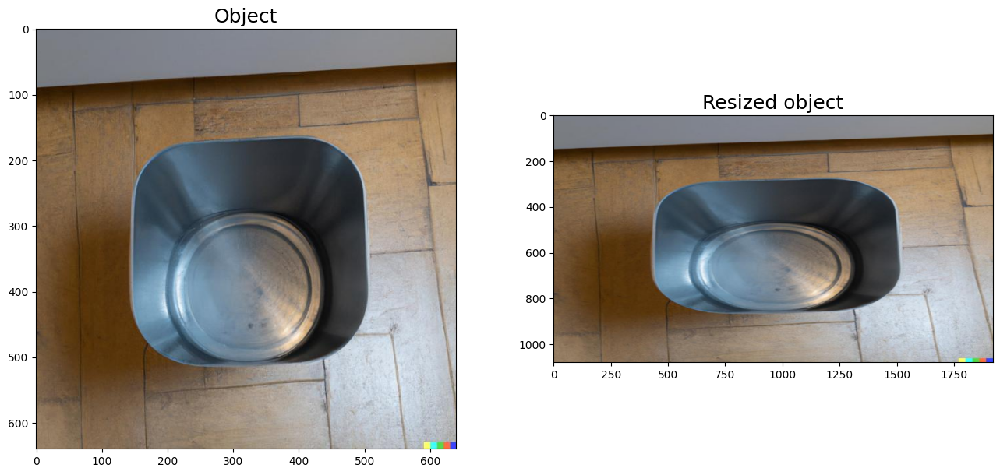

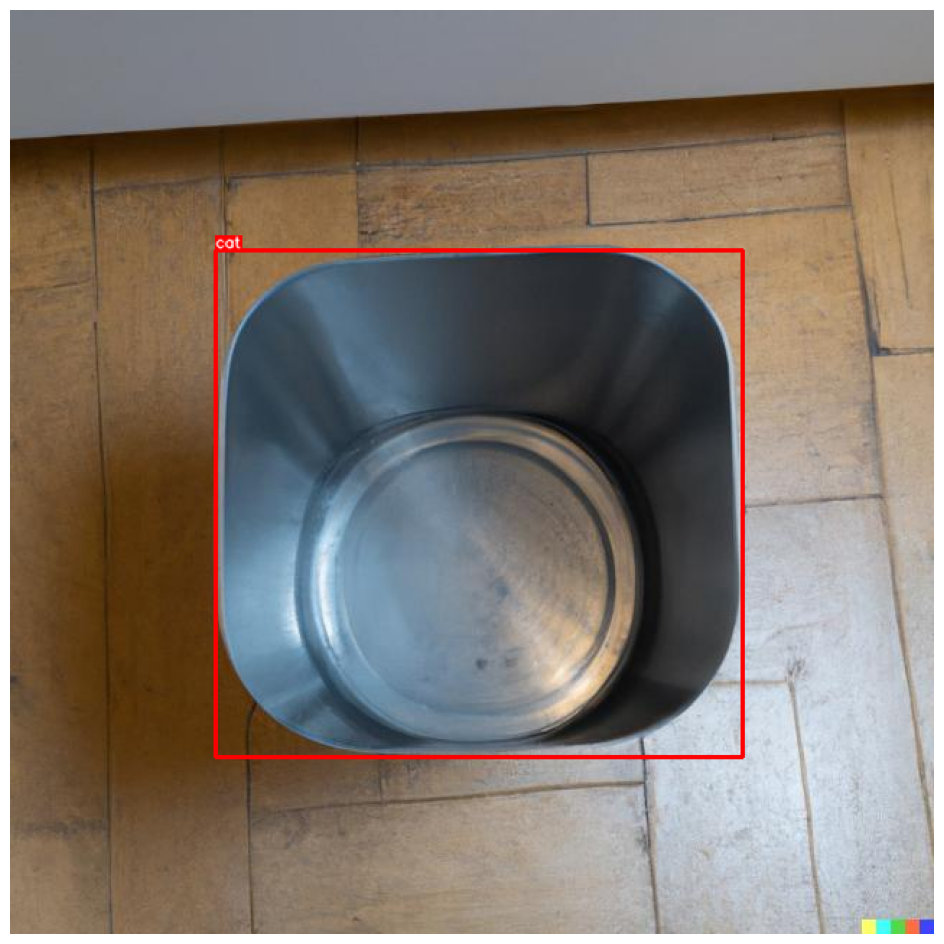

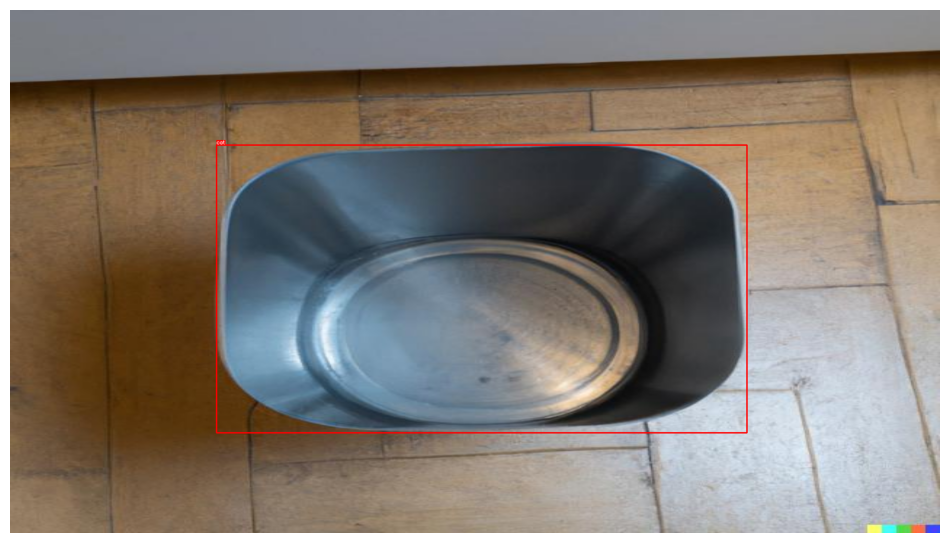

In [52]:
# given a certain image and a bounding box associated, I want to resize the image and the bounding box and visualize the result

def resize_img_and_bbox(img, bbox, desired_max, desired_min=None):
       
    h, w = img.shape[0], img.shape[1]
    
    longest, shortest = max(h, w), min(h, w)
    longest_new = desired_max
    if desired_min:
        shortest_new = desired_min
    else:
        shortest_new = int(shortest * (longest_new / longest))
    
    if h > w:
        h_new, w_new = longest_new, shortest_new
    else:
        h_new, w_new = shortest_new, longest_new
        
    #We define the transformation for the image without forgetting to add the bbox_params

    transform_resize = A.Compose([

        A.Sequential([
            A.Resize(h_new, w_new, interpolation=1, always_apply=False, p=1)
        ], p=1),],
        bbox_params=A.BboxParams(format='coco', label_fields=['category_ids'])
    )

    transformed = transform_resize(image=img, bboxes=[bbox], category_ids=[0])
    img_r = transformed["image"]
    bbox_r = transformed["bboxes"][0]
        
    return img_r, bbox_r

# now we test this function and visualize the result

img_path = '/Users/macbook/Desktop/Algo Wastetide/data/bg/bg_5.jpg'
bounding_box = get_bbox()[5]

img, mask = get_img_and_mask(img_path, mask_path)
img_r, bbox_r = resize_img_and_bbox(img, bounding_box, desired_max=1920, desired_min=1080)

print("Shape of the original image:", img.shape)
print("Shape of the resized image:", img_r.shape)
print("Bounding box before resizing:", bounding_box)
print("Bounding box after resizing:", bbox_r)

fig, ax = plt.subplots(1, 2, figsize=(16, 7))
ax[0].imshow(img)
ax[0].set_title('Object', fontsize=18)
ax[1].imshow(img_r)
ax[1].set_title('Resized object', fontsize=18);




bboxes = [bounding_box]
category_ids = [1]
category_id_to_name = {1: 'cat'}

visualize(img, bboxes, category_ids, category_id_to_name)
visualize(img_r, [bbox_r], category_ids, category_id_to_name)


xmin, ymin, xmax, ymax: 426.0 280.125 1521.0 873.9140625


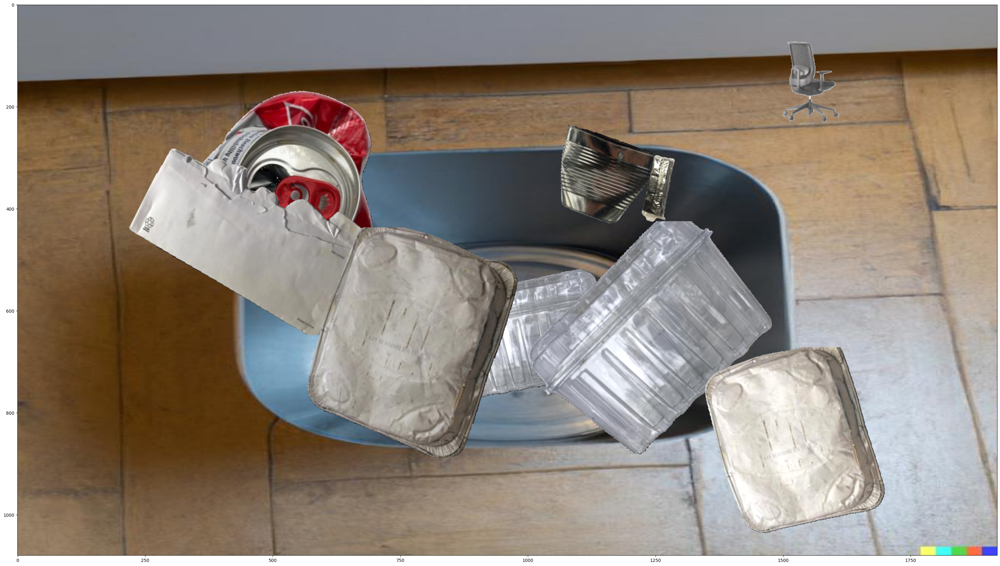

In [94]:
img_path = '/Users/macbook/Desktop/Algo Wastetide/data/bg/bg_5.jpg'
bounding_box = get_bbox()[5]

img, mask = get_img_and_mask(img_path, mask_path)
img_r, bbox_r = resize_img_and_bbox(img, bounding_box, desired_max=1920, desired_min=1080)

xmin, ymin, xmax, ymax = bbox_r[0], bbox_r[1], bbox_r[0]+bbox_r[2], bbox_r[1]+bbox_r[3]

print("xmin, ymin, xmax, ymax:", xmin, ymin, xmax, ymax)

img_comp_bg = create_bg_with_noise(['data/bg/bg_5.jpg'],
                                      files_bg_noise_imgs,
                                      files_bg_noise_masks,
                                      max_objs_to_add=1)    

img_comp, mask_comp, labels_comp, obj_areas = create_composition(img_comp_bg,
                                                                 max_objs=15,
                                                                 overlap_degree=0.8,
                                                                 max_attempts_per_obj=50,xmin=xmin,ymin=ymin,xmax=xmax,ymax=ymax)
plt.figure(figsize=(40,40))
plt.imshow(img_comp)

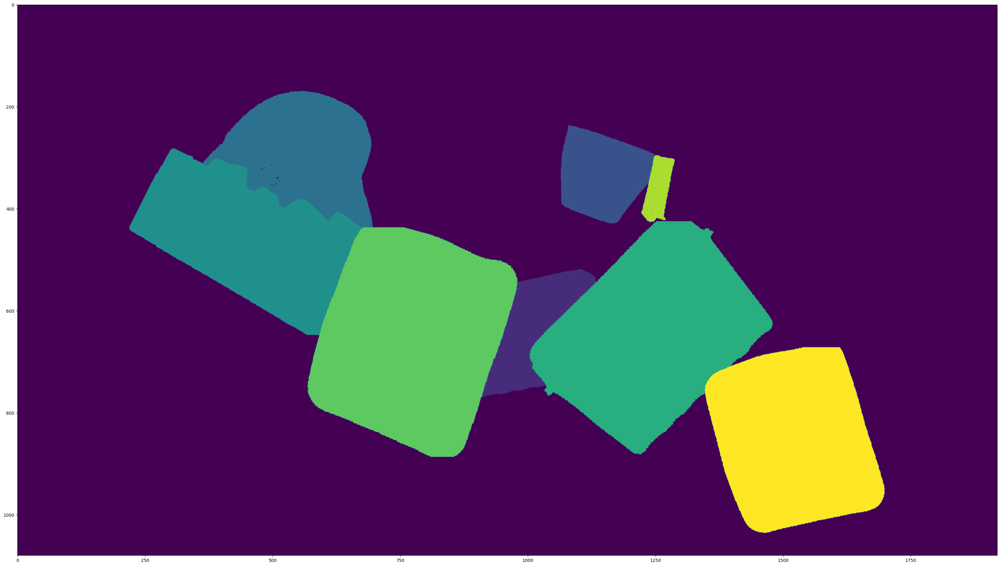

In [95]:
plt.figure(figsize=(40,40))
plt.imshow(mask_comp)

In [45]:
print("Labels (classes of the objects) on the composition in order of object's addition:", labels_comp)


Labels (classes of the objects) on the composition in order of object's addition: [1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 2, 1, 1, 1, 1]


In [13]:
obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]

print("Degree of how much area of each object is overlapped:")

for idx, mask in enumerate(masks):
    print(np.count_nonzero(mask) / obj_areas[idx])

NameError: name 'mask_comp' is not defined

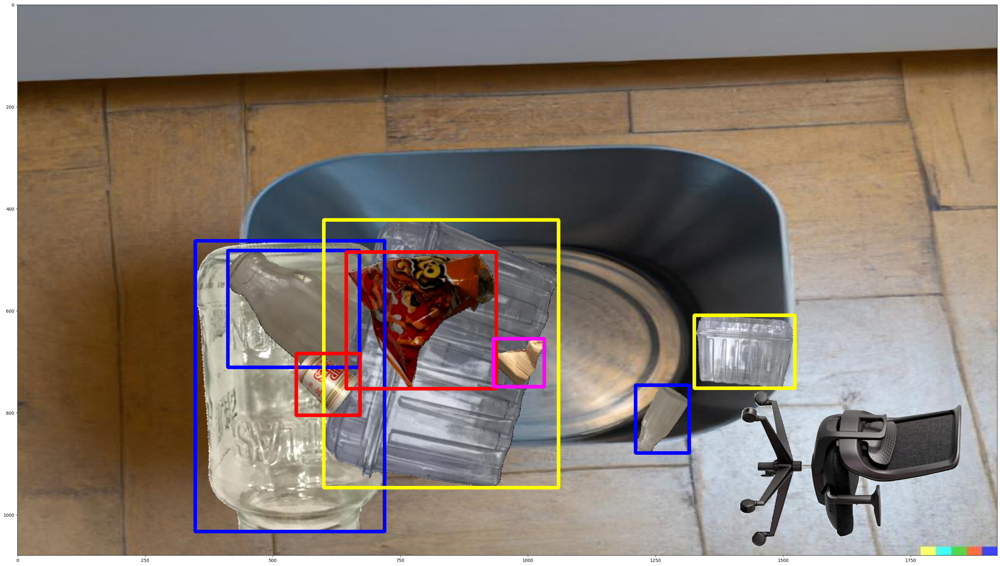

In [90]:
colors = {1: (255,0,0), 2: (0,255,0), 3: (0,0,255), 4: (255,255,0), 5: (255,0,255), 6: (0,255,255), 7: (255,255,255)}

img_comp_bboxes = img_comp.copy()

obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
masks = mask_comp == obj_ids[:, None, None]

for i in range(len(obj_ids)):
    
    pos = np.where(masks[i])
    xmin = np.min(pos[1])
    xmax = np.max(pos[1])
    ymin = np.min(pos[0])
    ymax = np.max(pos[0])
    img_comp_bboxes = cv2.rectangle(img_comp_bboxes,
                                    (xmin, ymin),
                                    (xmax,ymax),
                                    colors[labels_comp[i]],
                                    6)
    
plt.figure(figsize=(40,40))
plt.imshow(img_comp_bboxes) 

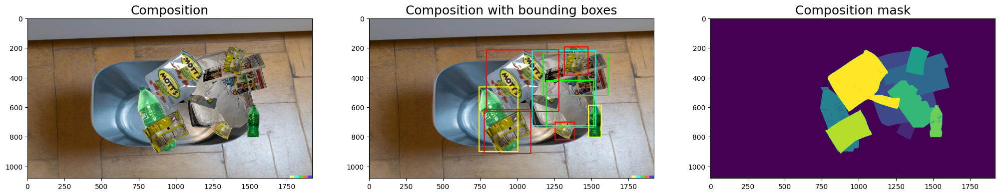

In [81]:
fig, ax = plt.subplots(1, 3, figsize=(25, 16))
ax[0].imshow(img_comp)
ax[0].set_title('Composition', fontsize=18)
ax[1].imshow(img_comp_bboxes)
ax[1].set_title('Composition with bounding boxes', fontsize=18)
ax[2].imshow(mask_comp)
ax[2].set_title('Composition mask', fontsize=18);


In [98]:
#we are going to generate many images and masks and save them in the folder 'data/compositions'

def generate_compositions(n_compositions,
                          files_bg_imgs,
                          files_bg_noise_imgs,
                          files_bg_noise_masks,
                          bg_max=1920,
                          bg_min=1080,
                          max_objs_to_add=60,
                          longest_bg_noise_max=1000,
                          longest_bg_noise_min=200,
                          blank_bg=False,
                          max_objs=15,
                          overlap_degree=0.2,
                          max_attempts_per_obj=10):
    
    if not os.path.exists('data/compositions'):
        os.makedirs('data/compositions')
        
    for i in tqdm(range(n_compositions)):
        
        img_comp_bg = create_bg_with_noise(files_bg_imgs,
                                           files_bg_noise_imgs,
                                           files_bg_noise_masks,
                                           bg_max,
                                           bg_min,
                                           max_objs_to_add,
                                           longest_bg_noise_max,
                                           longest_bg_noise_min,
                                           blank_bg)
        
        img_comp, mask_comp, labels_comp, obj_areas = create_composition(img_comp_bg,
                                                                         max_objs,
                                                                         overlap_degree,
                                                                         max_attempts_per_obj,xmin=xmin,ymin=ymin,xmax=xmax,ymax=ymax)
        
        cv2.imwrite('data/compositions/img_comp_' + str(i) + '.jpg', cv2.cvtColor(img_comp, cv2.COLOR_RGB2BGR))
        cv2.imwrite('data/compositions/mask_comp_' + str(i) + '.jpg', cv2.cvtColor(mask_comp, cv2.COLOR_RGB2BGR))
        
        with open('data/compositions/labels_comp_' + str(i) + '.txt', 'w') as f:
            for label in labels_comp:
                f.write(str(label) + '\n')
                
        with open('data/compositions/obj_areas_' + str(i) + '.txt', 'w') as f:
            for area in obj_areas:
                f.write(str(area) + '\n')


img_path = '/Users/macbook/Desktop/Algo Wastetide/data/bg/bg_5.jpg'
bounding_box = get_bbox()[5]

img, mask = get_img_and_mask(img_path, mask_path)
img_r, bbox_r = resize_img_and_bbox(img, bounding_box, desired_max=1920, desired_min=1080)

xmin, ymin, xmax, ymax = bbox_r[0], bbox_r[1], bbox_r[0]+bbox_r[2], bbox_r[1]+bbox_r[3]

generate_compositions(50,
                        ['data/bg/bg_5.jpg',],
                        files_bg_noise_imgs,
                        files_bg_noise_masks,
                        bg_max=1920,
                        bg_min=1080,
                        max_objs_to_add=2,
                        longest_bg_noise_max=300,
                        longest_bg_noise_min=200,
                        blank_bg=False,
                        max_objs=40,
                        overlap_degree=0.8,
                        max_attempts_per_obj=10)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [01:21<00:00,  1.64s/it]


In [100]:
def create_yolo_annotations(mask_comp, labels_comp):
    comp_w, comp_h = mask_comp.shape[1], mask_comp.shape[0]
    
    obj_ids = np.unique(mask_comp).astype(np.uint8)[1:]
    masks = mask_comp == obj_ids[:, None, None]

    annotations_yolo = []
    for i in range(len(labels_comp)):
        pos = np.where(masks[i])
        xmin = np.min(pos[1])
        xmax = np.max(pos[1])
        ymin = np.min(pos[0])
        ymax = np.max(pos[0])

        xc = (xmin + xmax) / 2
        yc = (ymin + ymax) / 2
        w = xmax - xmin
        h = ymax - ymin

        annotations_yolo.append([labels_comp[i] - 1,
                                 round(xc/comp_w, 5),
                                 round(yc/comp_h, 5),
                                 round(w/comp_w, 5),
                                 round(h/comp_h, 5)])

    return annotations_yolo

In [107]:
def generate_dataset(imgs_number, folder, split='train'):  #specific background and bounding box associated with it
    time_start = time.time()
    for j in tqdm(range(imgs_number)):
        img_comp_bg = create_bg_with_noise(['data/bg/bg_5.jpg',],
                                           files_bg_noise_imgs,
                                           files_bg_noise_masks,
                                           max_objs_to_add=2)
        
        img_comp, mask_comp, labels_comp, _ = create_composition(img_comp_bg,
                                                                 max_objs=20,
                                                                 overlap_degree=0.8,
                                                                 max_attempts_per_obj=10,xmin=xmin,ymin=ymin,xmax=xmax,ymax=ymax)

        img_comp = cv2.cvtColor(img_comp, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(folder, split, 'images/{}.jpg').format(j), img_comp)

        annotations_yolo = create_yolo_annotations(mask_comp, labels_comp)
        for i in range(len(annotations_yolo)):
            with open(os.path.join(folder, split, 'labels/{}.txt').format(j), "a") as f:
                f.write(' '.join(str(el) for el in annotations_yolo[i]) + '\n')
                
    time_end = time.time()
    time_total = round(time_end - time_start)
    time_per_img = round((time_end - time_start) / imgs_number, 1)
    
    print("Generation of {} synthetic images is completed. It took {} seconds, or {} seconds per image".format(imgs_number, time_total, time_per_img))
    print("Images are stored in '{}'".format(os.path.join(folder, split, 'images')))
    print("Annotations are stored in '{}'".format(os.path.join(folder, split, 'labels')))

In [108]:
generate_dataset(50, 'data/dataset_composed/', split='train')

100%|██████████| 50/50 [01:53<00:00,  2.26s/it]

Generation of 50 synthetic images is completed. It took 113 seconds, or 2.3 seconds per image
Images are stored in 'data/dataset_composed/train/images'
Annotations are stored in 'data/dataset_composed/train/labels'
